In [1]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display
import os

import torch, torchaudio
import librosa

from python_helpers import get_project_root_dir

In [2]:
root_dir = get_project_root_dir()

In [3]:
torch.random.manual_seed(0)

def plot_waveform(waveform, sr, title=None, ax=None):
    waveform = waveform.numpy()

    num_frames = waveform.shape[-1]
    time_axis = torch.arange(0, num_frames) / sr

    if ax is None:
        _, ax = plt.subplots(1, 1)
    ax.plot(time_axis, waveform, linewidth=1)
    ax.grid(True)
    ax.set_xlim([0, time_axis[-1]])
    if title is not None:
        ax.set_title(title)


def plot_spectrogram(specgram, title=None, ylabel="freq_bin", ax=None):
    if ax is None:
        _, ax = plt.subplots(1, 1)
    if title is not None:
        ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto", interpolation="nearest")

In [4]:
test_path = os.path.join(root_dir, 'data', 'SoundTracks', 'Set1', '003.mp3')
TARGET_SAMPLE_RATE = 44100

waveform, sr = torchaudio.load(test_path)
print(sr, TARGET_SAMPLE_RATE)
print(type(waveform), waveform.shape, waveform.shape[1] / sr)

44100 44100
<class 'torch.Tensor'> torch.Size([2, 817920]) 18.546938775510203


In [5]:
if sr != TARGET_SAMPLE_RATE:
    waveform = torchaudio.transforms.Resample(sr, TARGET_SAMPLE_RATE)(waveform)
    print(type(waveform), waveform.shape, waveform.shape[1] / TARGET_SAMPLE_RATE)

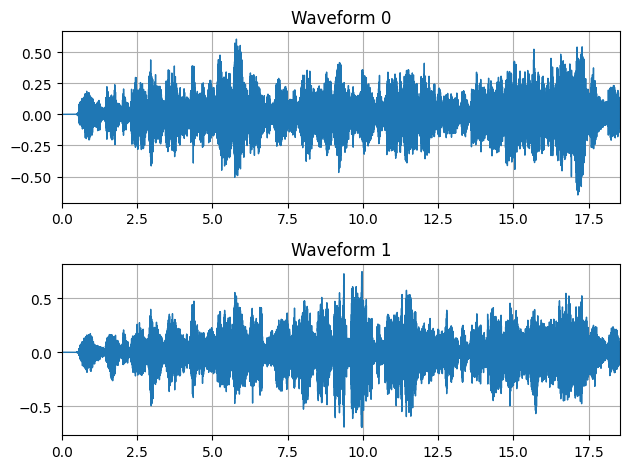

In [6]:
fig, axes = plt.subplots(2, 1)
plot_waveform(waveform[0], sr, title='Waveform 0', ax=axes[0])
plot_waveform(waveform[1], sr, title='Waveform 1', ax=axes[1])
plt.xscale('linear')
fig.tight_layout()

In [7]:
IPython.display.Audio(waveform.numpy(), rate=sr)

In [8]:
class Stereo2Mono(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.weights = torch.tensor([0.5, 0.5], requires_grad=False).view(2, 1)

    def forward(self, waveform: torch.Tensor) -> torch.Tensor:
        return torch.sum(waveform * self.weights, dim=0) * np.sqrt(2)

In [9]:
mono_wf = Stereo2Mono()(waveform)
print(type(mono_wf), mono_wf.shape)

<class 'torch.Tensor'> torch.Size([817920])


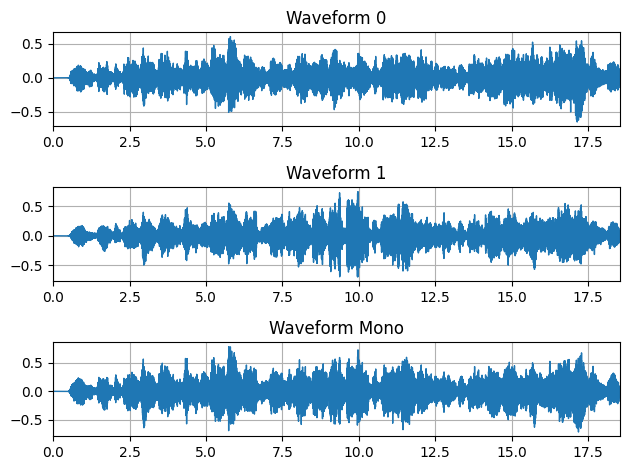

In [10]:
fig, axes = plt.subplots(3, 1)
plot_waveform(waveform[0], sr, title='Waveform 0', ax=axes[0])
plot_waveform(waveform[1], sr, title='Waveform 1', ax=axes[1])
plot_waveform(mono_wf, sr, title='Waveform Mono', ax=axes[2])
plt.xscale('linear')
fig.tight_layout()

In [11]:
mono_melspec = torchaudio.transforms.MelSpectrogram(
    sample_rate=TARGET_SAMPLE_RATE,
    n_fft=8192, 
    n_mels=1024,
    center=False,
)(mono_wf)
print(type(mono_melspec), mono_melspec.shape)

<class 'torch.Tensor'> torch.Size([1024, 198])


/Users/jigneshmotwani/Moodify-CDS-2025/venv/lib/python3.13/site-packages/torchaudio/functional/functional.py:584: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (1024) may be set too high. Or, the value for `n_freqs` (4097) may be set too low.
  warnings.warn(


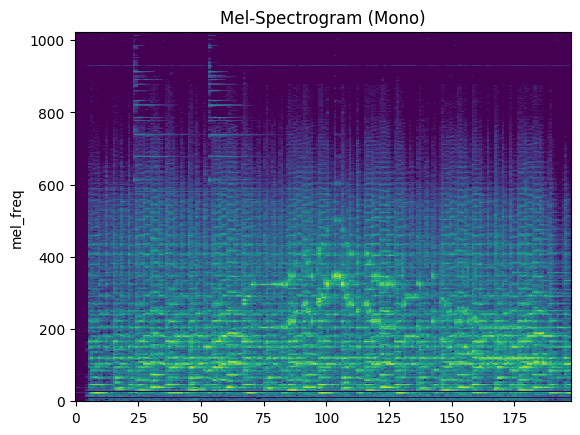

In [12]:
plot_spectrogram(mono_melspec, title='Mel-Spectrogram (Mono)', ylabel='mel_freq')
plt.show()

In [13]:
IPython.display.Audio(mono_wf, rate=TARGET_SAMPLE_RATE)

In [14]:
def split_waveform_segments(wf: torch.Tensor, target_len: int, k: int=TARGET_SAMPLE_RATE) -> list[torch.Tensor]:
    assert len(wf.shape) == 1

    wf_len = wf.shape[0]

    if wf_len < target_len:
        return [wf.detach().clone()]
    else:
        tensor_ls = []
        for i in range(int(np.ceil(round(wf_len / target_len, 7)))):
            if wf_len - i * target_len > target_len:
                tensor_ls.append(wf[i*target_len:(i+1)*target_len])
            else:
                if wf_len - i * target_len > k:
                    tensor_ls.append(wf[-target_len:])
    
    return tensor_ls

In [15]:
audio_len = mono_wf.shape[0]
target_audio_len = 15 * TARGET_SAMPLE_RATE
print(audio_len, target_audio_len)

817920 661500


In [16]:
test_segments = split_waveform_segments(mono_wf, target_audio_len)

In [17]:
IPython.display.Audio(mono_wf, rate=TARGET_SAMPLE_RATE)

In [18]:
IPython.display.Audio(test_segments[0], rate=TARGET_SAMPLE_RATE)

In [19]:
IPython.display.Audio(test_segments[1], rate=TARGET_SAMPLE_RATE)